# 📥 Importing Libraries

In [1]:
import os
os.chdir('../')
os.getcwd()

'c:\\DS projects\\Weather-Image-Classification'

In [37]:
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import Callback, EarlyStopping
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from tensorflow.keras.optimizers import Adam
import numpy as np
import pickle
import json

# 🗃️ Load Dataset

In [38]:
path = 'data/dataset'
path_imgs = list(glob.glob(path+'/**/*.jpg'))
path_imgs[0:5]

['data/dataset\\dew\\2208.jpg',
 'data/dataset\\dew\\2209.jpg',
 'data/dataset\\dew\\2210.jpg',
 'data/dataset\\dew\\2211.jpg',
 'data/dataset\\dew\\2212.jpg']

In [39]:
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], path_imgs))
images = pd.Series(path_imgs, name='Images').astype(str)
labels = pd.Series(labels, name='Labels')
data = pd.concat([images, labels], axis=1)
data = data.sample(frac=1).reset_index(drop=True)
data.head()


,Images,Labels
0,data/dataset\sandstorm\3418.jpg,sandstorm
1,data/dataset\rain\1499.jpg,rain
2,data/dataset\hail\0425.jpg,hail
3,data/dataset\frost\3698.jpg,frost
4,data/dataset\rime\5928.jpg,rime


In [40]:
data['Labels'].value_counts()

Labels
rime         1160
fogsmog       851
dew           698
sandstorm     692
glaze         639
snow          621
hail          591
rain          526
frost         475
lightning     377
rainbow       232
Name: count, dtype: int64

### Considering data of 400 per each category if available because the data is very big:



In [42]:
data = data.groupby('Labels').apply(lambda x: x.sample(min(len(x), 400), random_state=42))
data = data.sample(frac=1).reset_index(drop=True)
data['Labels'].value_counts()

C:\Users\latha\AppData\Local\Temp\ipykernel_17236\883939589.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data = data.groupby('Labels').apply(lambda x: x.sample(min(len(x), 400), random_state=42))


Labels
rain         400
frost        400
hail         400
dew          400
glaze        400
fogsmog      400
sandstorm    400
snow         400
rime         400
lightning    377
rainbow      232
Name: count, dtype: int64

# 🔥 EDA & Visualization

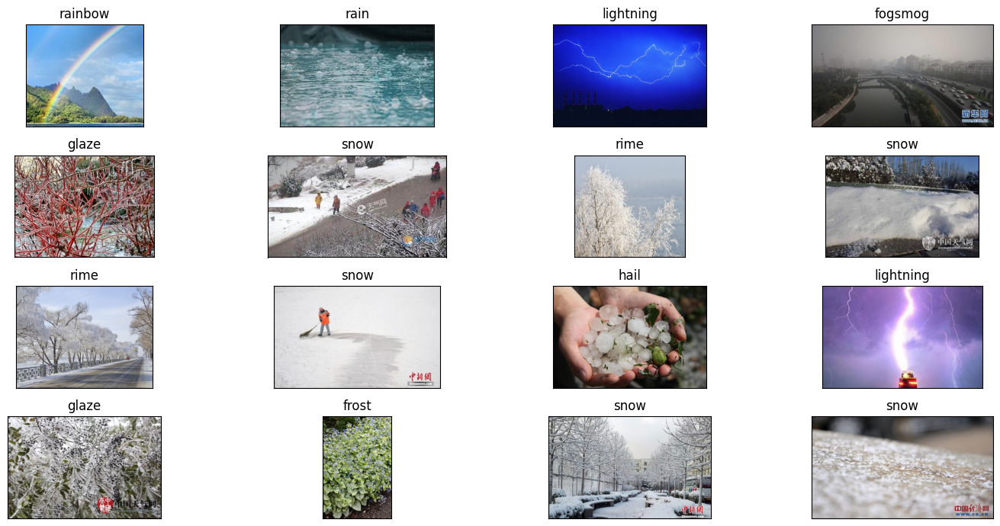

In [ ]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15,7), subplot_kw={'xticks':[], 'yticks':[]})
for i, ax in enumerate(axes.flat):
   ax.imshow(plt.imread(data.Images[i]))
   ax.set_title(data.Labels[i])
plt.tight_layout()
plt.show()

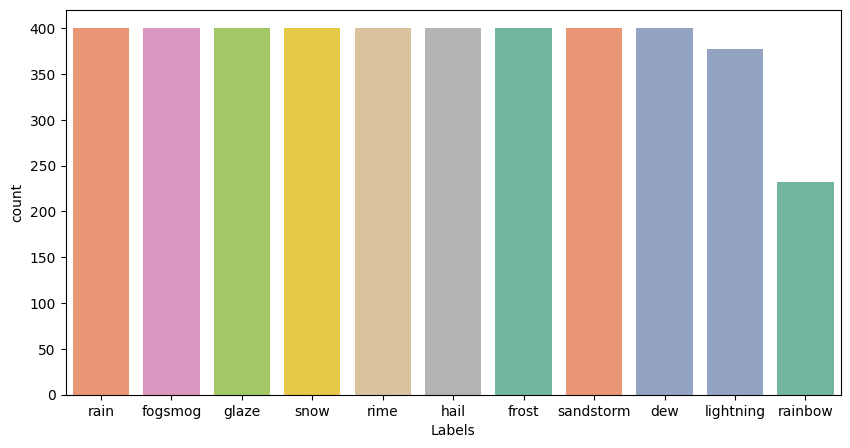

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='Labels', data=data, order=data['Labels'].value_counts().index, palette='Set2', hue='Labels')
plt.show()

# ✂️ Train & Test Split

In [43]:
train_data, test_data = train_test_split(data, test_size=0.2, random_state=42)

# 🦾 Functions

In [44]:
# Data Generator
def data_generator(preprocessor, train, test, image_size):
  train_datagen = ImageDataGenerator(
      preprocessing_function=preprocessor,
      rotation_range=30,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest',
      validation_split=0.2
  )
  test_datagen = ImageDataGenerator(preprocessing_function=preprocessor)

  train_gen = train_datagen.flow_from_dataframe(
      dataframe=train,
      x_col='Images',
      y_col='Labels',
      shuffle=True,
      batch_size=32,
      target_size=(image_size, image_size),
      subset='training',
      class_model='categorical'
  )

  valid_gen = train_datagen.flow_from_dataframe(
      dataframe=train,
      x_col='Images',
      y_col='Labels',
      shuffle=True,
      batch_size=32,
      target_size=(image_size, image_size),
      subset='validation',
      class_model='categorical'
  )

  test_gen = test_datagen.flow_from_dataframe(
      dataframe=test,
      x_col='Images',
      y_col='Labels',
      shuffle=False,
      batch_size=32,
      target_size=(image_size, image_size),
      class_mode='categorical'
  )

  return train_gen, valid_gen, test_gen


In [45]:
# Model Function
len_labels = len(data['Labels'].unique())
def model_structure(model_name, image_size):
  model = model_name(weights='imagenet', input_shape=(image_size, image_size, 3), include_top=False)
  model.trainable=False
  input = model.input
  x = model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(256, activation='relu')(x)
  x = Dropout(0.5)(x)
  x = Dense(128, activation='relu')(x)
  x = Dropout(0.2)(x)
  output = Dense(len_labels, activation='softmax')(x)

  model = Model(inputs=input, outputs=output)

  model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

  callback = [EarlyStopping(patience=2)]

  return model, callback



In [46]:
# Visualizing the results

def visualize_results(history, train_gen, test_gen, model):
   fig, ax = plt.subplots(1,2, figsize=(12,5))
   sns.set_theme(style='whitegrid', rc={'axes.facecolor':'#5fa1bc'})

   ax[0].plot(history.history['accuracy'], label='Train Accuracy', color='blue')
   ax[0].plot(history.history['val_accuracy'], label='Validation Accuracy', color='red')
   ax[0].set_title('Accuracy')
   ax[0].set_xlabel('Epochs')
   ax[0].set_ylabel('Accuracy')
   ax[0].legend()

   ax[1].plot(history.history['loss'], label='Train Loss', color='blue')
   ax[1].plot(history.history['val_loss'], label='Validation Loss', color='red')
   ax[1].set_title('Loss')
   ax[1].set_xlabel('Epochs')
   ax[1].set_ylabel('Loss')
   ax[1].legend()

   plt.tight_layout()
   plt.show()


   pred = model.predict(test_gen)
   pred = np.argmax(pred, axis=1)
   labels = (train_gen.class_indices)
   labels = dict((v,k) for k,v in labels.items())
   pred = [labels[i] for i in pred]

   cm = confusion_matrix(test_data['Labels'], pred)
   class_report = classification_report(test_data['Labels'], pred)

   print('Classification Report: \n', class_report)
   plt.figure(figsize=(10, 8))
   sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=labels.values(), yticklabels=labels.values())
   plt.title("Confusion Matrix")
   plt.xlabel("Predicted")
   plt.ylabel("True")
   plt.show()

   fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(12,8), subplot_kw={'xticks':[], 'yticks':[]})

   for i, axes in enumerate(axes.flat):
     axes.imshow(plt.imread(test_data.Images.iloc[i+1]))
     axes.set_title(f'True:{test_data.Labels.iloc[i+1]} \n Predicted: {pred[i+1]}')

   plt.tight_layout()
   plt.show()






In [47]:
# # Test Results
# def test_results(test_gen, model):
#   results = model.predict(test_gen)
#   print(f'Test Loss: {results[0]:.2f}')
#   print(f'Test Accuracy: {results[1]:.2f}')
#   return results

In [48]:
import json
def test_results(test_gen, model, model_name):
   results = model.evaluate(test_gen)
   #model_name = model.__class__.__name__
   results_dict = {
       'Test Loss': results[0],
       'Test Accuracy': results[1]
   }
   print(f'Test Loss: {results[0]:.2f}')
   print(f'Test Accuracy: {results[1]:.2f}')

  #  filename = f'{model_name}_test_results.json'
  #  path = os.path.join('/content/drive/MyDrive/results', f'{model_name}.json')

   with open(f'./artifacts_notebook/results/{model_name}.json', 'w') as file:
     json.dump(results_dict, file)

   return results

In [49]:
# Save the model
def save_model(model, model_name):
  with open(f'./artifacts_notebook/models/models/{model_name}.pkl', 'wb') as file:
    pickle.dump(model, file)


# 📚 Training models

# ✔️ EfficientNetB7

In [ ]:
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.applications.efficientnet import preprocess_input

train_gen, valid_gen, test_gen = data_generator(preprocess_input, train_data, test_data, 600)
Enet_model, callback = model_structure(EfficientNetB7, 600)
history = Enet_model.fit(train_gen, validation_data=valid_gen, epochs=100, callbacks=callback)
# visualize_results(history, train_gen, test_gen, Enet_model)
# results_enet = test_results(test_gen, Enet_model)
# save_model(Enet_model)


Found 2694 validated image filenames belonging to 11 classes.
Found 673 validated image filenames belonging to 11 classes.
Found 842 validated image filenames belonging to 11 classes.
258076736/258076736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


85/85 ━━━━━━━━━━━━━━━━━━━━ 1214s 12s/step - accuracy: 0.4690 - loss: 1.5733 - val_accuracy: 0.7905 - val_loss: 0.6008
Epoch 2/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 420s 4s/step - accuracy: 0.7411 - loss: 0.6938 - val_accuracy: 0.8128 - val_loss: 0.4894
Epoch 3/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 383s 4s/step - accuracy: 0.8013 - loss: 0.5717 - val_accuracy: 0.8113 - val_loss: 0.4966
Epoch 4/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 380s 4s/step - accuracy: 0.8022 - loss: 0.5286 - val_accuracy: 0.8395 - val_loss: 0.4458
Epoch 5/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 381s 4s/step - accuracy: 0.8437 - loss: 0.4597 - val_accuracy: 0.8395 - val_loss: 0.4275
Epoch 6/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 380s 4s/step - accuracy: 0.8510 - loss: 0.4264 - val_accuracy: 0.8366 - val_loss: 0.4862
Epoch 7/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 381s 4s/step - accuracy: 0.8392 - loss: 0.4164 - val_accuracy: 0.8648 - val_loss: 0.4001
Epoch 8/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 383s 4s/step - accuracy: 0.8778 - loss: 0.3450 - val_accuracy: 0.8499 - val

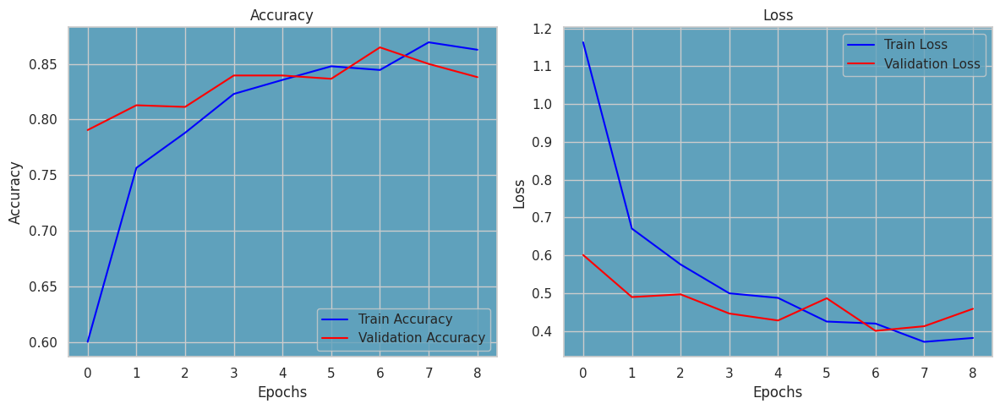

27/27 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step
Classification Report: 
               precision    recall  f1-score   support

         dew       1.00      0.99      0.99        76
     fogsmog       0.70      0.74      0.72        74
       frost       0.78      0.92      0.84        74
       glaze       0.91      0.55      0.68        77
        hail       0.97      0.95      0.96        80
   lightning       1.00      1.00      1.00        73
        rain       0.90      0.91      0.91        93
     rainbow       0.91      0.93      0.92        44
        rime       0.71      0.90      0.79        86
   sandstorm       0.86      0.73      0.79        89
        snow       0.80      0.84      0.82        76

    accuracy                           0.86       842
   macro avg       0.87      0.86      0.86       842
weighted avg       0.87      0.86      0.85       842



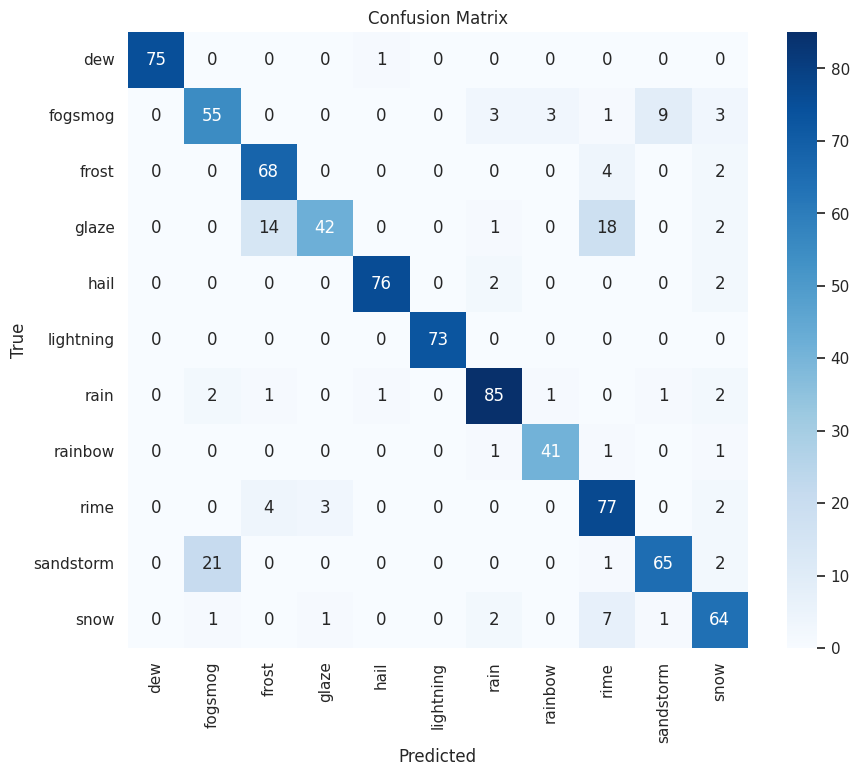

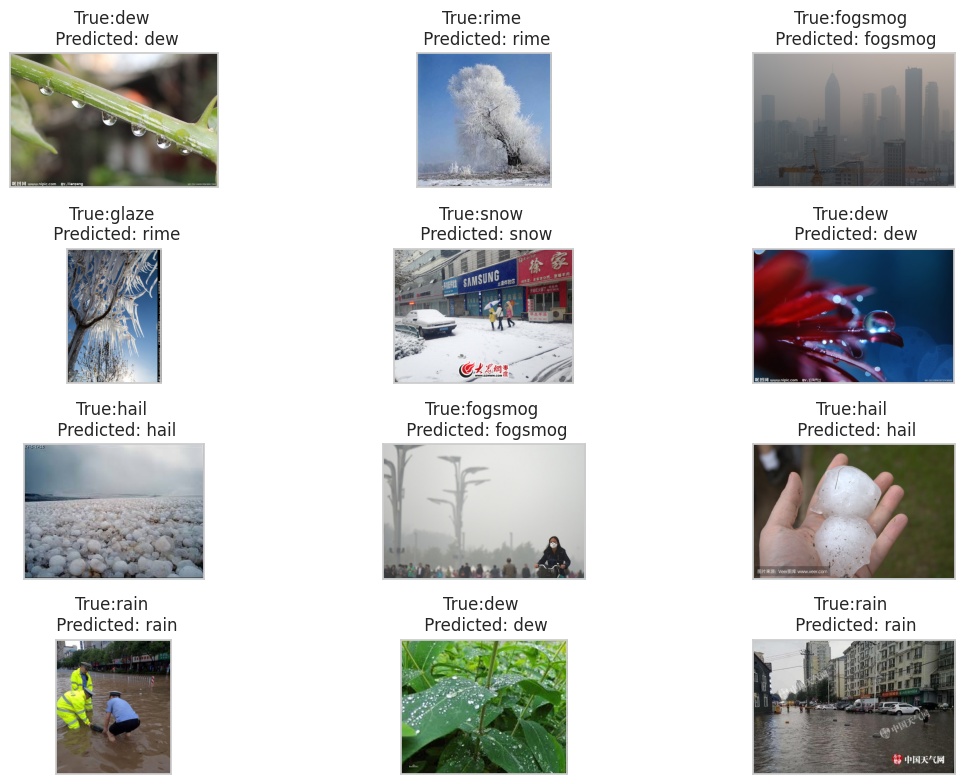

27/27 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.8413 - loss: 0.4434
Test Loss: 0.40
Test Accuracy: 0.86


In [ ]:
visualize_results(history, train_gen, test_gen, Enet_model)
#results_enet = test_results(test_gen, Enet_model, 'Efficient_model')


In [ ]:
results_enet = test_results(test_gen, Enet_model, 'Efficient_model')

27/27 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.8413 - loss: 0.4434
Test Loss: 0.40
Test Accuracy: 0.86


In [ ]:
save_model(Enet_model, 'Efficient_model')

# ✔️ ResNet50

Found 2694 validated image filenames belonging to 11 classes.
Found 673 validated image filenames belonging to 11 classes.
Found 842 validated image filenames belonging to 11 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


85/85 ━━━━━━━━━━━━━━━━━━━━ 100s 956ms/step - accuracy: 0.3974 - loss: 1.8778 - val_accuracy: 0.8039 - val_loss: 0.6171
Epoch 2/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 82s 906ms/step - accuracy: 0.7367 - loss: 0.7691 - val_accuracy: 0.8470 - val_loss: 0.5035
Epoch 3/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 61s 678ms/step - accuracy: 0.7830 - loss: 0.6489 - val_accuracy: 0.8455 - val_loss: 0.4610
Epoch 4/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 63s 692ms/step - accuracy: 0.7981 - loss: 0.5940 - val_accuracy: 0.8410 - val_loss: 0.4860
Epoch 5/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 81s 687ms/step - accuracy: 0.8069 - loss: 0.5541 - val_accuracy: 0.8529 - val_loss: 0.4741


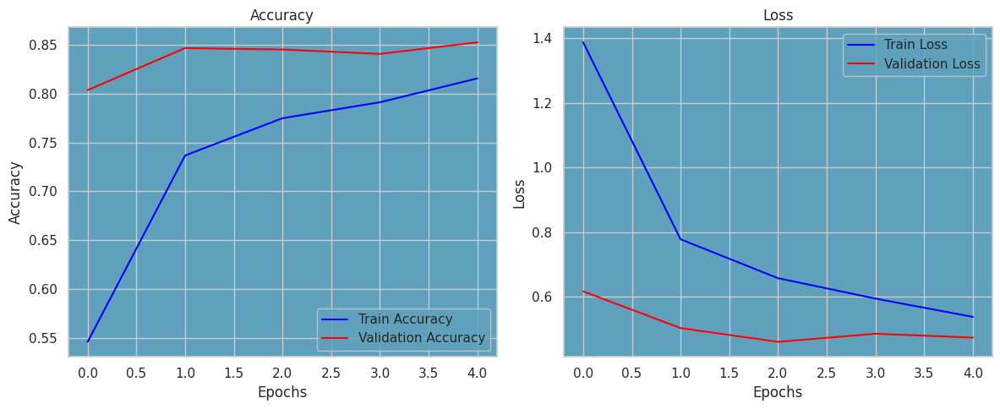

27/27 ━━━━━━━━━━━━━━━━━━━━ 14s 353ms/step
Classification Report: 
               precision    recall  f1-score   support

         dew       0.90      1.00      0.95        76
     fogsmog       0.90      0.89      0.90        74
       frost       0.81      0.84      0.82        74
       glaze       0.80      0.73      0.76        77
        hail       0.97      0.84      0.90        80
   lightning       1.00      1.00      1.00        73
        rain       0.95      0.87      0.91        93
     rainbow       0.98      1.00      0.99        44
        rime       0.75      0.81      0.78        86
   sandstorm       0.96      0.90      0.93        89
        snow       0.74      0.88      0.81        76

    accuracy                           0.88       842
   macro avg       0.89      0.89      0.89       842
weighted avg       0.89      0.88      0.88       842



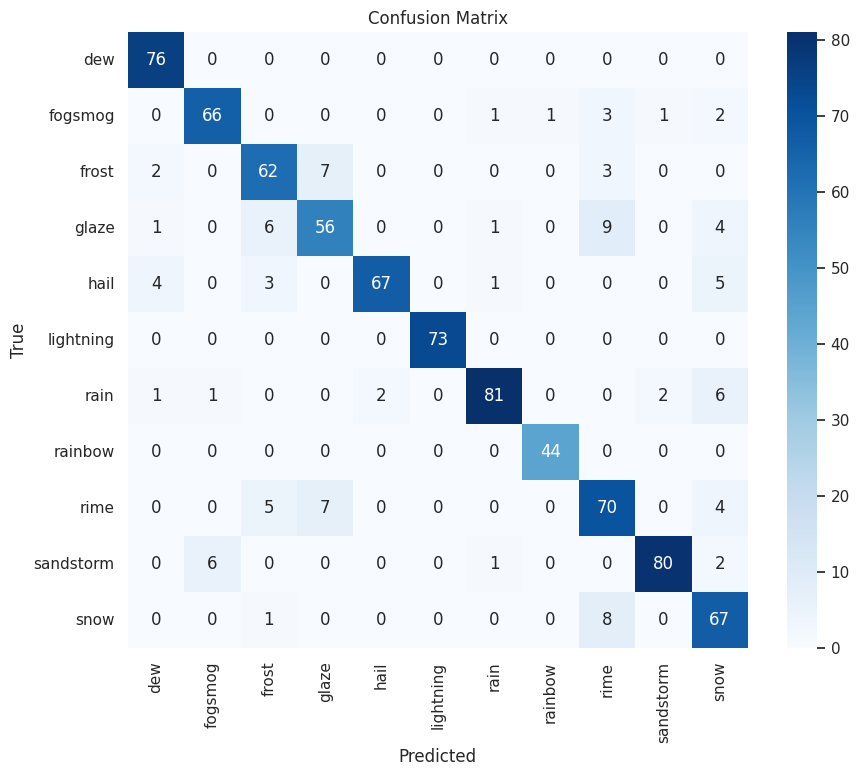

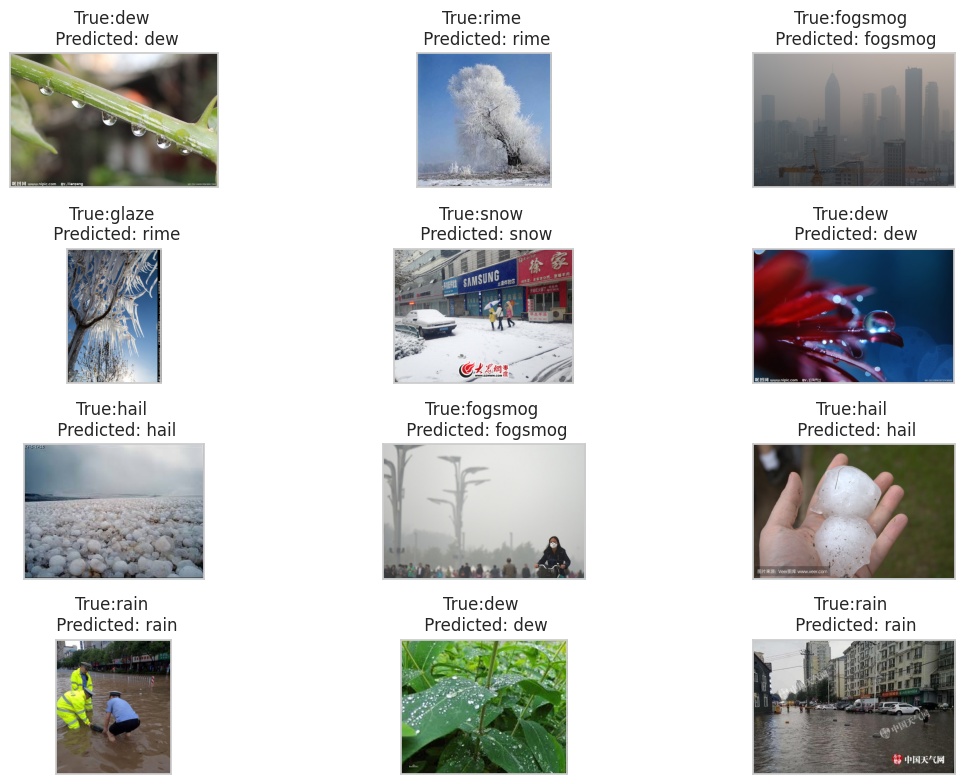

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 286ms/step - accuracy: 0.8893 - loss: 0.3334
Test Loss: 0.36
Test Accuracy: 0.88


In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

train_gen, valid_gen, test_gen = data_generator(preprocess_input, train_data, test_data, 224)
resnet50_model, callback = model_structure(ResNet50, 224)
history = resnet50_model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=100,
    callbacks=callback
)
visualize_results(history, train_gen, test_gen, resnet50_model)
results_resnet50 = test_results(test_gen, resnet50_model, 'ResNet50')
save_model(resnet50_model, 'ResNet50')

# ✔️ResNet152V2

Found 2694 validated image filenames belonging to 11 classes.
Found 673 validated image filenames belonging to 11 classes.
Found 842 validated image filenames belonging to 11 classes.
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


85/85 ━━━━━━━━━━━━━━━━━━━━ 97s 921ms/step - accuracy: 0.4341 - loss: 1.7041 - val_accuracy: 0.8143 - val_loss: 0.5619
Epoch 2/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 125s 793ms/step - accuracy: 0.7549 - loss: 0.7389 - val_accuracy: 0.8143 - val_loss: 0.5226
Epoch 3/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 81s 780ms/step - accuracy: 0.7882 - loss: 0.6146 - val_accuracy: 0.8559 - val_loss: 0.4346
Epoch 4/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 83s 786ms/step - accuracy: 0.7932 - loss: 0.5857 - val_accuracy: 0.8499 - val_loss: 0.4342
Epoch 5/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 72s 796ms/step - accuracy: 0.8119 - loss: 0.5162 - val_accuracy: 0.8544 - val_loss: 0.4465
Epoch 6/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 88s 855ms/step - accuracy: 0.8536 - loss: 0.4521 - val_accuracy: 0.8618 - val_loss: 0.4213
Epoch 7/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 73s 807ms/step - accuracy: 0.8519 - loss: 0.4392 - val_accuracy: 0.8692 - val_loss: 0.4241
Epoch 8/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 82s 811ms/step - accuracy: 0.8550 - loss: 0.4351 - val_accurac

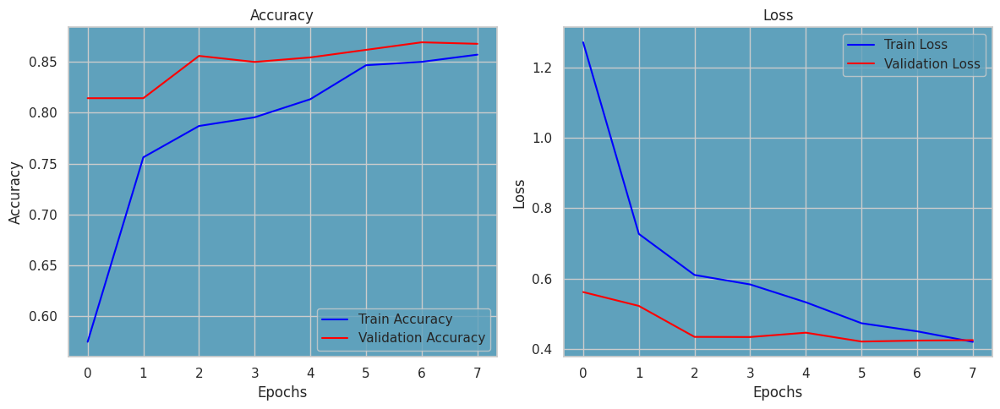

27/27 ━━━━━━━━━━━━━━━━━━━━ 15s 407ms/step
Classification Report: 
               precision    recall  f1-score   support

         dew       0.95      0.99      0.97        76
     fogsmog       0.88      0.91      0.89        74
       frost       0.74      0.85      0.79        74
       glaze       0.85      0.57      0.68        77
        hail       0.99      0.86      0.92        80
   lightning       0.94      1.00      0.97        73
        rain       0.90      0.92      0.91        93
     rainbow       0.98      1.00      0.99        44
        rime       0.78      0.87      0.82        86
   sandstorm       1.00      0.88      0.93        89
        snow       0.78      0.89      0.83        76

    accuracy                           0.88       842
   macro avg       0.89      0.89      0.88       842
weighted avg       0.89      0.88      0.88       842



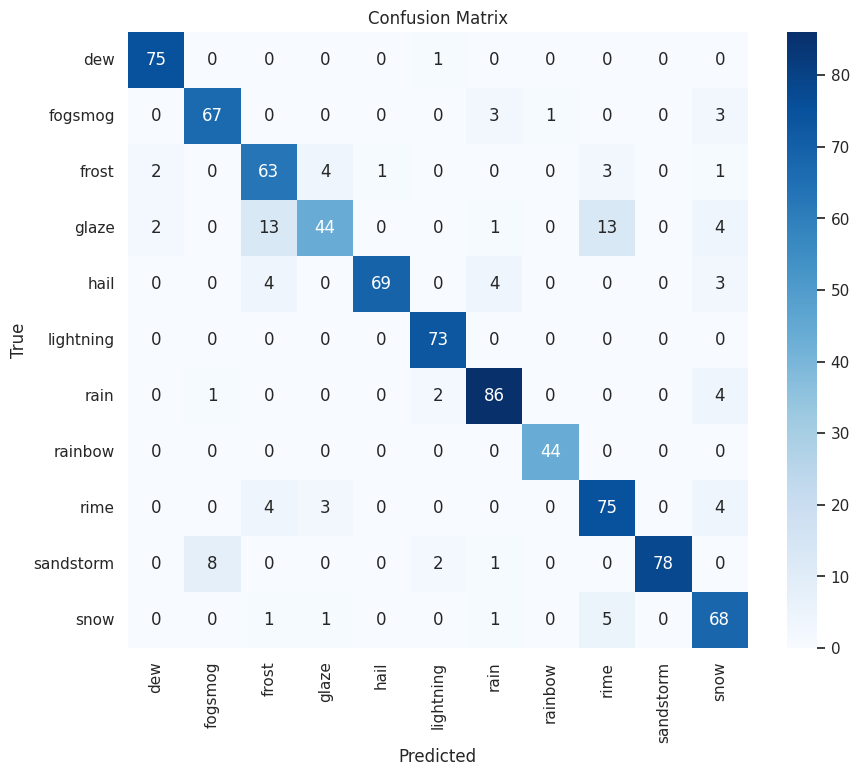

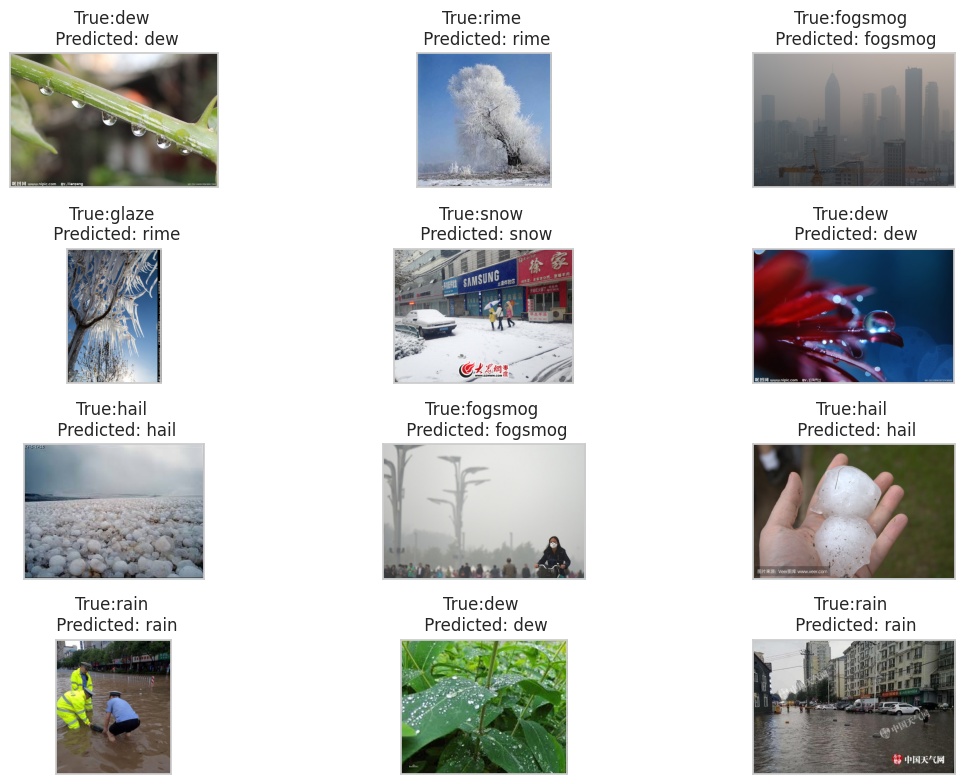

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 325ms/step - accuracy: 0.9039 - loss: 0.3080
Test Loss: 0.34
Test Accuracy: 0.88


In [ ]:
from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.applications.resnet import preprocess_input

train_gen, valid_gen, test_gen = data_generator(preprocess_input, train_data, test_data, 256)
resnet152_model, callback = model_structure(ResNet152V2, 256)
history = resnet152_model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=100,
    callbacks=callback
)
visualize_results(history, train_gen, test_gen, resnet152_model)
results_resnet152 = test_results(test_gen, resnet152_model, 'Resnet152V2')
save_model(resnet152_model, 'Resnet152V2')

# ✔️ MobileNet

Found 2694 validated image filenames belonging to 11 classes.
Found 673 validated image filenames belonging to 11 classes.
Found 842 validated image filenames belonging to 11 classes.
17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


85/85 ━━━━━━━━━━━━━━━━━━━━ 83s 811ms/step - accuracy: 0.3298 - loss: 2.1247 - val_accuracy: 0.7355 - val_loss: 0.7613
Epoch 2/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 59s 658ms/step - accuracy: 0.6875 - loss: 0.9316 - val_accuracy: 0.8351 - val_loss: 0.5228
Epoch 3/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 58s 634ms/step - accuracy: 0.7311 - loss: 0.7846 - val_accuracy: 0.8217 - val_loss: 0.5412
Epoch 4/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 85s 649ms/step - accuracy: 0.7639 - loss: 0.6558 - val_accuracy: 0.8440 - val_loss: 0.4678
Epoch 5/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 59s 652ms/step - accuracy: 0.8057 - loss: 0.5946 - val_accuracy: 0.8440 - val_loss: 0.4704
Epoch 6/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 59s 651ms/step - accuracy: 0.7942 - loss: 0.5641 - val_accuracy: 0.8470 - val_loss: 0.4364
Epoch 7/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 58s 652ms/step - accuracy: 0.8220 - loss: 0.5238 - val_accuracy: 0.8618 - val_loss: 0.4188
Epoch 8/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 68s 757ms/step - accuracy: 0.8228 - loss: 0.4964 - val_accuracy

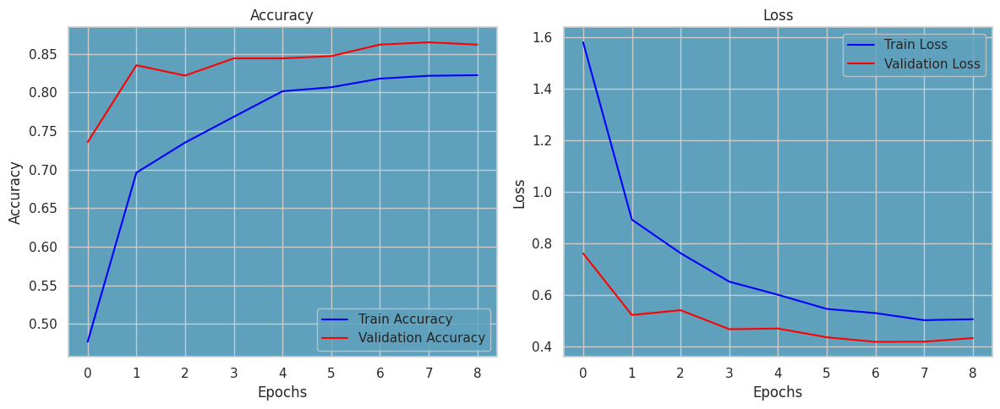

27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 287ms/step
Classification Report: 
               precision    recall  f1-score   support

         dew       0.97      1.00      0.99        76
     fogsmog       0.95      0.73      0.82        74
       frost       0.81      0.85      0.83        74
       glaze       0.76      0.75      0.76        77
        hail       0.97      0.89      0.93        80
   lightning       0.97      0.99      0.98        73
        rain       0.77      0.92      0.84        93
     rainbow       0.93      0.98      0.96        44
        rime       0.85      0.78      0.81        86
   sandstorm       0.86      0.93      0.89        89
        snow       0.82      0.78      0.80        76

    accuracy                           0.87       842
   macro avg       0.88      0.87      0.87       842
weighted avg       0.87      0.87      0.87       842



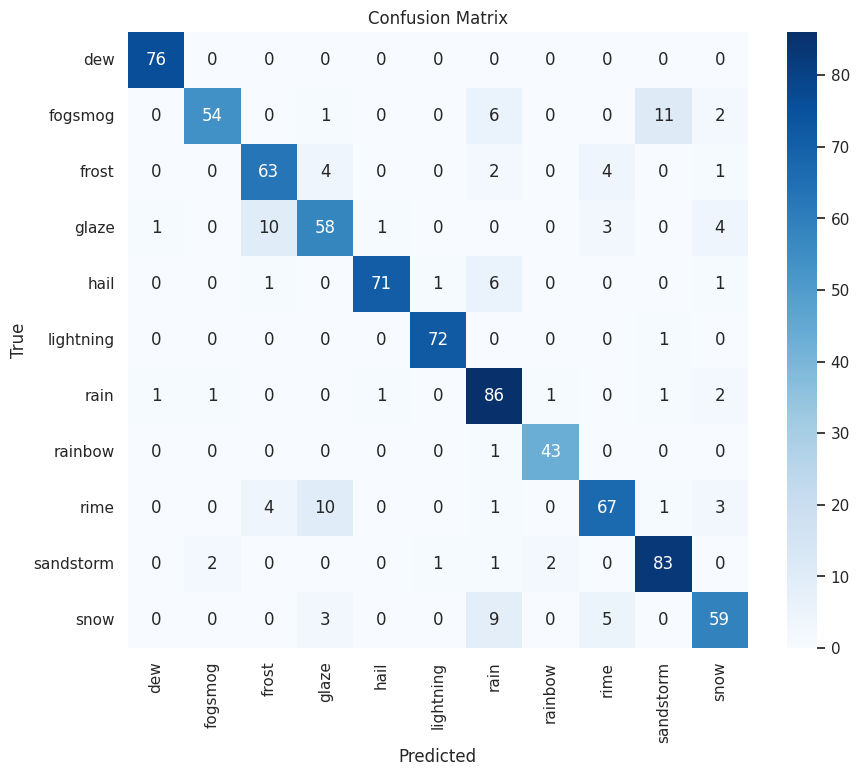

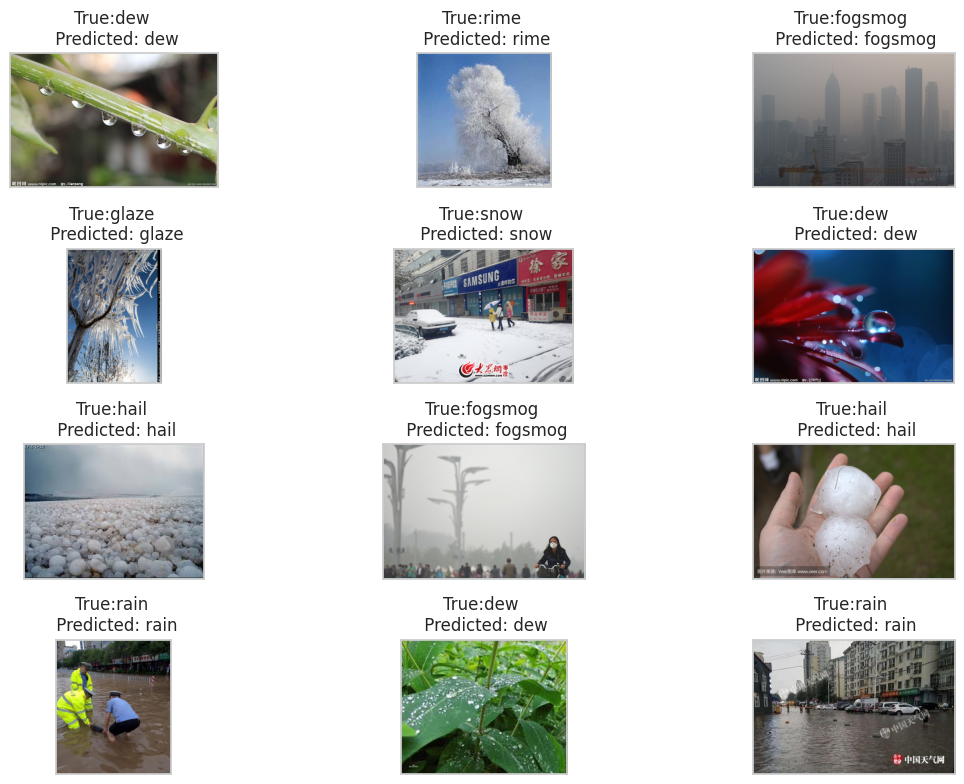

27/27 ━━━━━━━━━━━━━━━━━━━━ 7s 272ms/step - accuracy: 0.8899 - loss: 0.3235
Test Loss: 0.35
Test Accuracy: 0.87


In [ ]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input

train_gen, valid_gen, test_gen = data_generator(preprocess_input, train_data, test_data, 224)
mobilenet_model, callback = model_structure(MobileNet, 224)
history = mobilenet_model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=100,
    callbacks=callback
)
visualize_results(history, train_gen, test_gen, mobilenet_model)
results_mobilnet = test_results(test_gen, mobilenet_model,'MobileNet')
save_model(mobilenet_model,'MobileNet')

# ✔️ VGG19

Found 2694 validated image filenames belonging to 11 classes.
Found 673 validated image filenames belonging to 11 classes.
Found 842 validated image filenames belonging to 11 classes.
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


85/85 ━━━━━━━━━━━━━━━━━━━━ 93s 859ms/step - accuracy: 0.2755 - loss: 3.2253 - val_accuracy: 0.6909 - val_loss: 0.9642
Epoch 2/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 122s 809ms/step - accuracy: 0.5988 - loss: 1.2605 - val_accuracy: 0.7415 - val_loss: 0.7415
Epoch 3/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 74s 708ms/step - accuracy: 0.6547 - loss: 1.0053 - val_accuracy: 0.7801 - val_loss: 0.6911
Epoch 4/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 89s 800ms/step - accuracy: 0.7238 - loss: 0.8540 - val_accuracy: 0.7860 - val_loss: 0.6067
Epoch 5/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 64s 708ms/step - accuracy: 0.7454 - loss: 0.7723 - val_accuracy: 0.7920 - val_loss: 0.5846
Epoch 6/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 89s 795ms/step - accuracy: 0.7533 - loss: 0.7275 - val_accuracy: 0.7994 - val_loss: 0.5855
Epoch 7/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 64s 702ms/step - accuracy: 0.7747 - loss: 0.6769 - val_accuracy: 0.8187 - val_loss: 0.5523
Epoch 8/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 63s 698ms/step - accuracy: 0.7743 - loss: 0.6737 - val_accurac

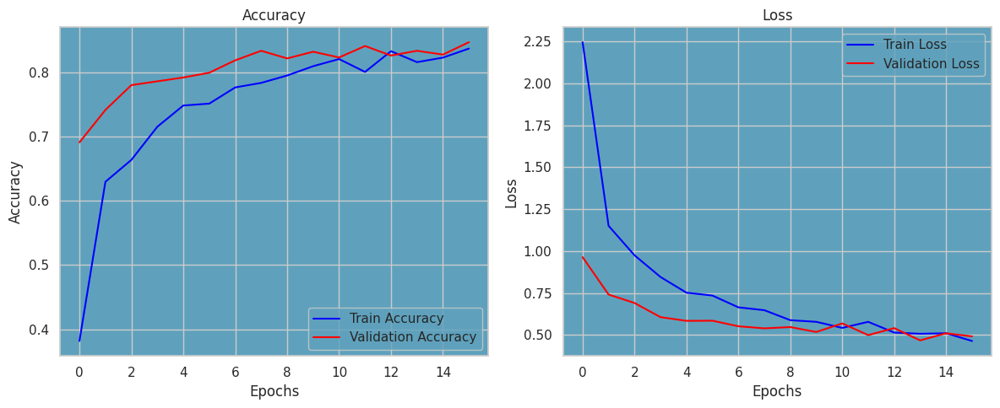

27/27 ━━━━━━━━━━━━━━━━━━━━ 13s 447ms/step
Classification Report: 
               precision    recall  f1-score   support

         dew       0.99      0.97      0.98        76
     fogsmog       0.79      0.81      0.80        74
       frost       0.70      0.84      0.77        74
       glaze       0.80      0.58      0.68        77
        hail       0.96      0.81      0.88        80
   lightning       0.95      0.97      0.96        73
        rain       0.76      0.92      0.83        93
     rainbow       1.00      0.95      0.98        44
        rime       0.77      0.91      0.83        86
   sandstorm       0.95      0.79      0.86        89
        snow       0.80      0.78      0.79        76

    accuracy                           0.85       842
   macro avg       0.86      0.85      0.85       842
weighted avg       0.85      0.85      0.84       842



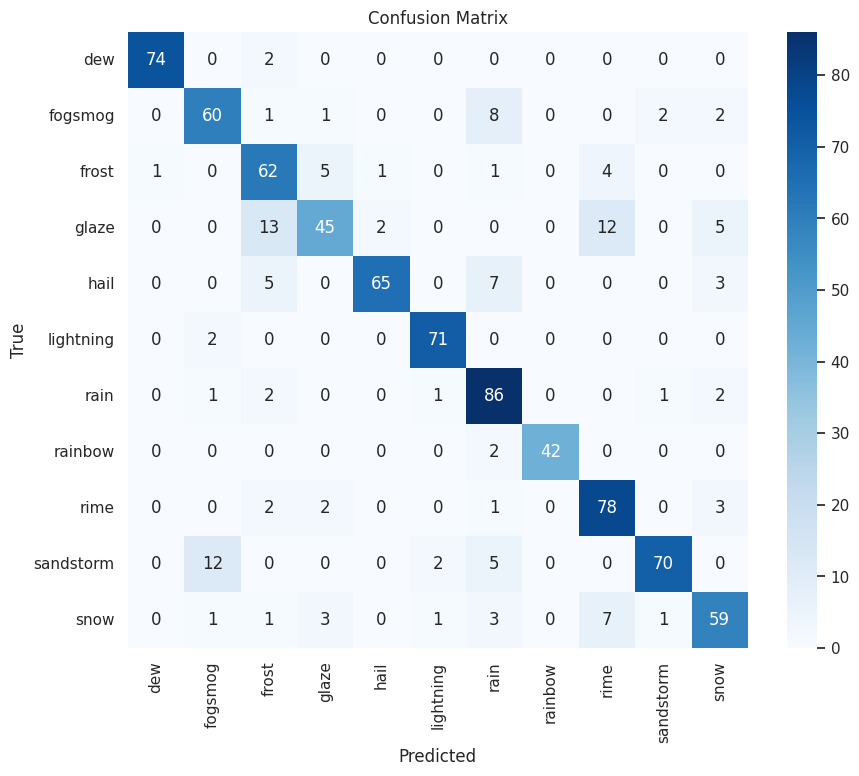

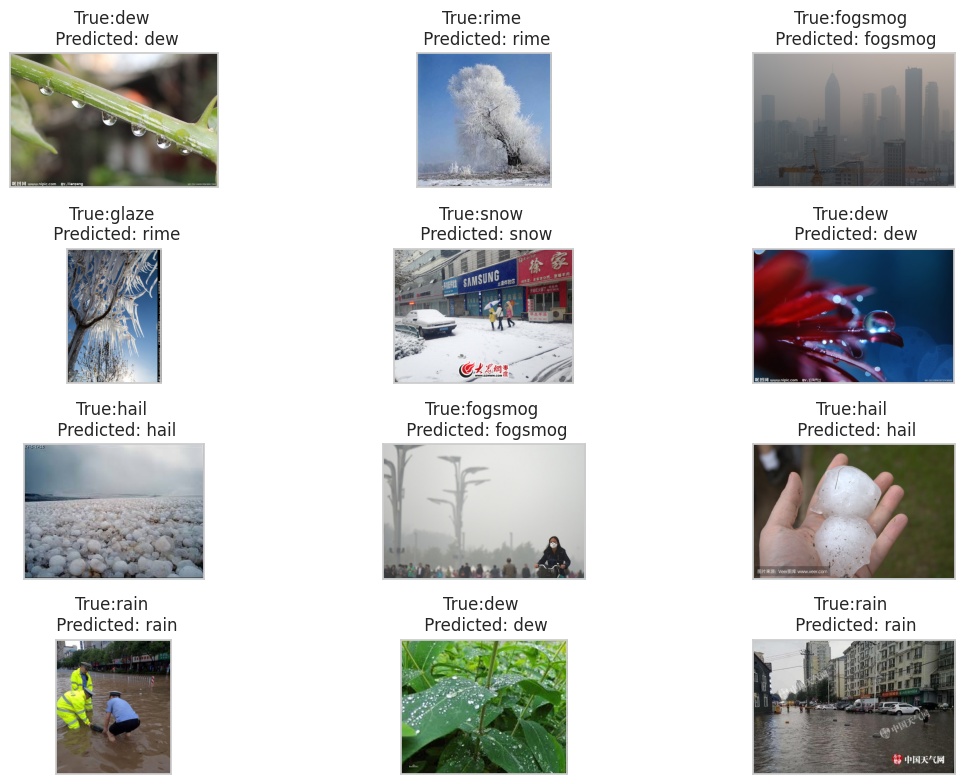

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 283ms/step - accuracy: 0.8567 - loss: 0.4495
Test Loss: 0.50
Test Accuracy: 0.85


In [ ]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input

train_gen, valid_gen, test_gen = data_generator(preprocess_input, train_data, test_data, 224)
vgg19_model, callback = model_structure(VGG19, 224)
history = vgg19_model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=100,
    callbacks=callback
)
visualize_results(history, train_gen, test_gen, vgg19_model)
results_vgg19 = test_results(test_gen, vgg19_model,'VGG19')
save_model(vgg19_model,'VGG19')

# ✔️ Xception

Found 2694 validated image filenames belonging to 11 classes.
Found 673 validated image filenames belonging to 11 classes.
Found 842 validated image filenames belonging to 11 classes.
83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


85/85 ━━━━━━━━━━━━━━━━━━━━ 132s 1s/step - accuracy: 0.3510 - loss: 1.8538 - val_accuracy: 0.7667 - val_loss: 0.7604
Epoch 2/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 113s 1s/step - accuracy: 0.7088 - loss: 0.8598 - val_accuracy: 0.7964 - val_loss: 0.5857
Epoch 3/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 140s 1s/step - accuracy: 0.7524 - loss: 0.7471 - val_accuracy: 0.8172 - val_loss: 0.5586
Epoch 4/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - accuracy: 0.7936 - loss: 0.6247 - val_accuracy: 0.8039 - val_loss: 0.5824
Epoch 5/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 97s 1s/step - accuracy: 0.7914 - loss: 0.6307 - val_accuracy: 0.8068 - val_loss: 0.5837


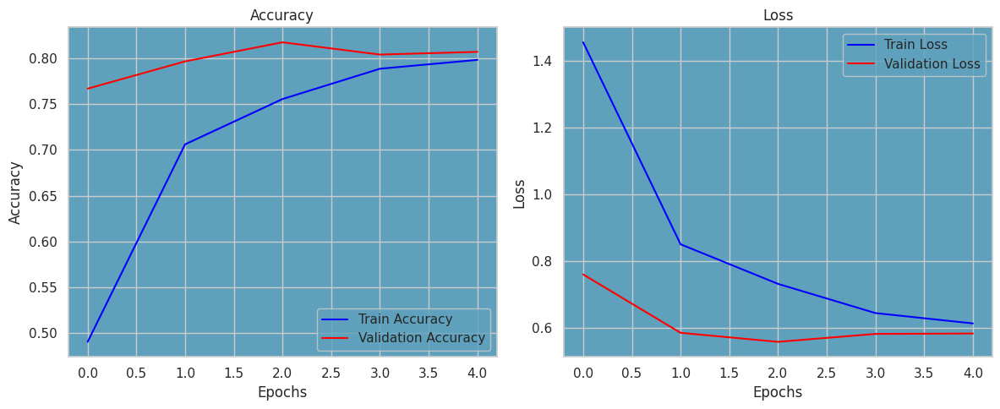

27/27 ━━━━━━━━━━━━━━━━━━━━ 18s 579ms/step
Classification Report: 
               precision    recall  f1-score   support

         dew       0.94      1.00      0.97        76
     fogsmog       0.72      0.91      0.80        74
       frost       0.83      0.86      0.85        74
       glaze       0.89      0.65      0.75        77
        hail       1.00      0.81      0.90        80
   lightning       0.97      0.95      0.96        73
        rain       0.90      0.77      0.83        93
     rainbow       1.00      1.00      1.00        44
        rime       0.67      0.84      0.75        86
   sandstorm       0.79      0.89      0.84        89
        snow       0.81      0.72      0.76        76

    accuracy                           0.85       842
   macro avg       0.87      0.85      0.85       842
weighted avg       0.86      0.85      0.85       842



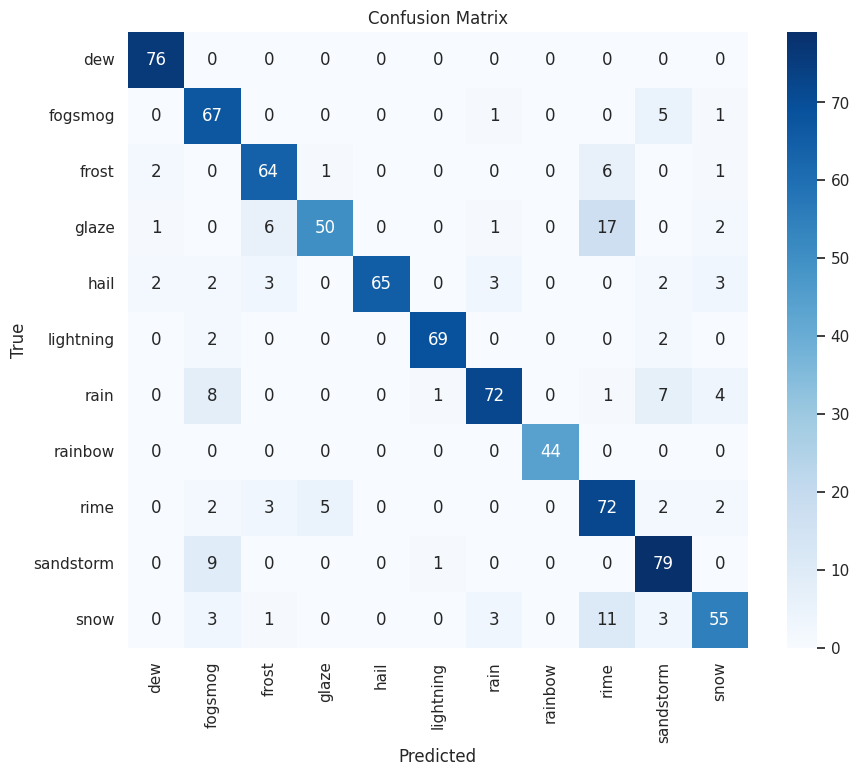

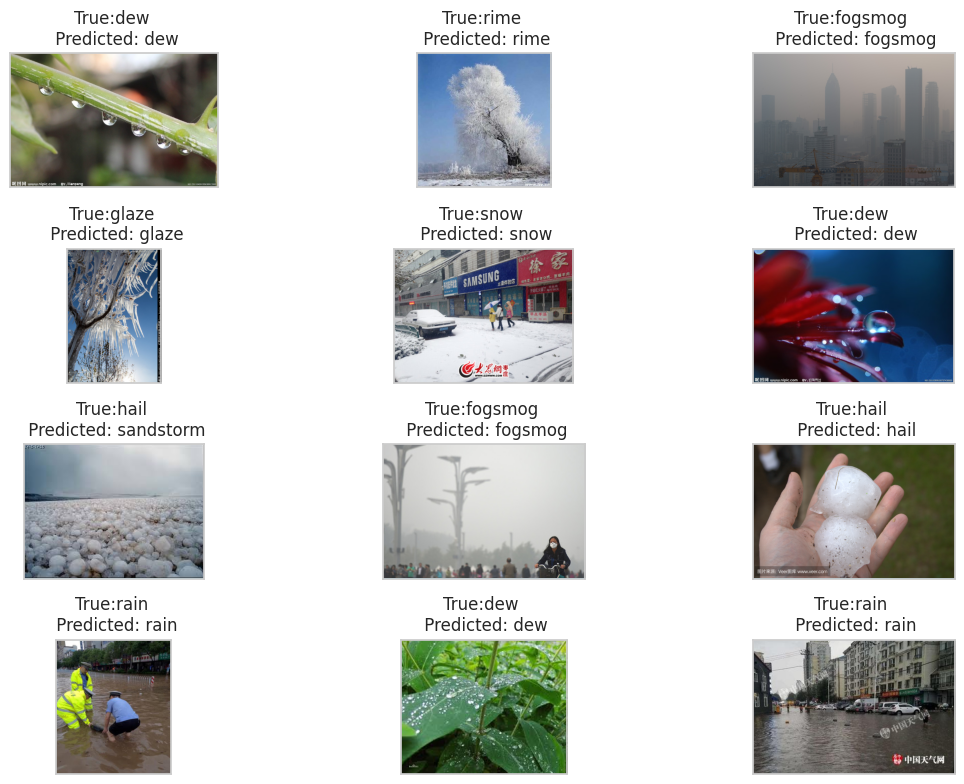

27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 348ms/step - accuracy: 0.8516 - loss: 0.4703
Test Loss: 0.49
Test Accuracy: 0.85


In [ ]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications.xception import preprocess_input

train_gen, valid_gen, test_gen = data_generator(preprocess_input, train_data, test_data, 299)
xception_model, callback = model_structure(Xception, 299)
history = xception_model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=100,
    callbacks=callback
)
visualize_results(history, train_gen, test_gen, xception_model)
results_xception = test_results(test_gen, xception_model,'Xception')
save_model(xception_model,'Xception')

# ✔️ InceptionResNetV2

Found 2694 validated image filenames belonging to 11 classes.
Found 673 validated image filenames belonging to 11 classes.
Found 842 validated image filenames belonging to 11 classes.
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


85/85 ━━━━━━━━━━━━━━━━━━━━ 155s 1s/step - accuracy: 0.2689 - loss: 2.1577 - val_accuracy: 0.7013 - val_loss: 0.9657
Epoch 2/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 101s 1s/step - accuracy: 0.6063 - loss: 1.1359 - val_accuracy: 0.7712 - val_loss: 0.7199
Epoch 3/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 98s 1s/step - accuracy: 0.6891 - loss: 0.9332 - val_accuracy: 0.7623 - val_loss: 0.6957
Epoch 4/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 99s 1s/step - accuracy: 0.7125 - loss: 0.8134 - val_accuracy: 0.7637 - val_loss: 0.6588
Epoch 5/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 98s 1s/step - accuracy: 0.7264 - loss: 0.7780 - val_accuracy: 0.7979 - val_loss: 0.5860
Epoch 6/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 143s 1s/step - accuracy: 0.7659 - loss: 0.7028 - val_accuracy: 0.8202 - val_loss: 0.5300
Epoch 7/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 97s 1s/step - accuracy: 0.7729 - loss: 0.6901 - val_accuracy: 0.8009 - val_loss: 0.5554
Epoch 8/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step - accuracy: 0.7784 - loss: 0.6698 - val_accuracy: 0.8217 - val_loss:

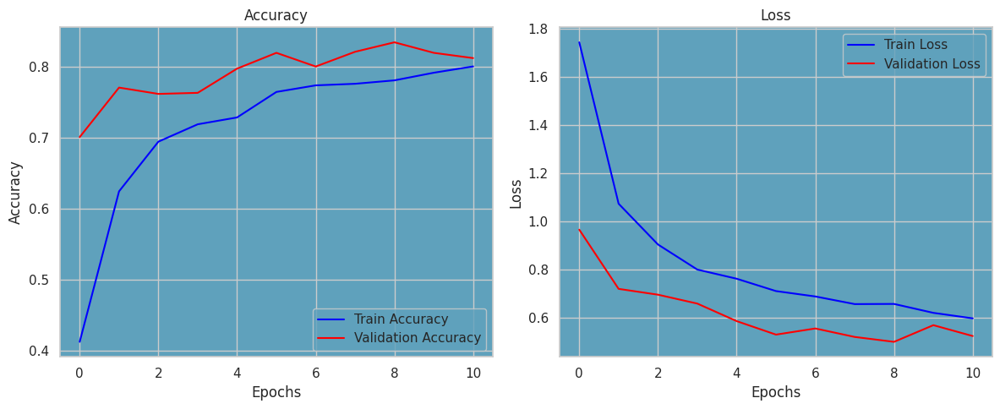

27/27 ━━━━━━━━━━━━━━━━━━━━ 33s 823ms/step
Classification Report: 
               precision    recall  f1-score   support

         dew       0.93      1.00      0.96        76
     fogsmog       0.76      0.77      0.77        74
       frost       0.87      0.78      0.82        74
       glaze       0.73      0.71      0.72        77
        hail       0.99      0.86      0.92        80
   lightning       0.99      0.96      0.97        73
        rain       0.84      0.88      0.86        93
     rainbow       1.00      0.91      0.95        44
        rime       0.72      0.81      0.77        86
   sandstorm       0.85      0.84      0.85        89
        snow       0.75      0.78      0.76        76

    accuracy                           0.84       842
   macro avg       0.86      0.85      0.85       842
weighted avg       0.85      0.84      0.85       842



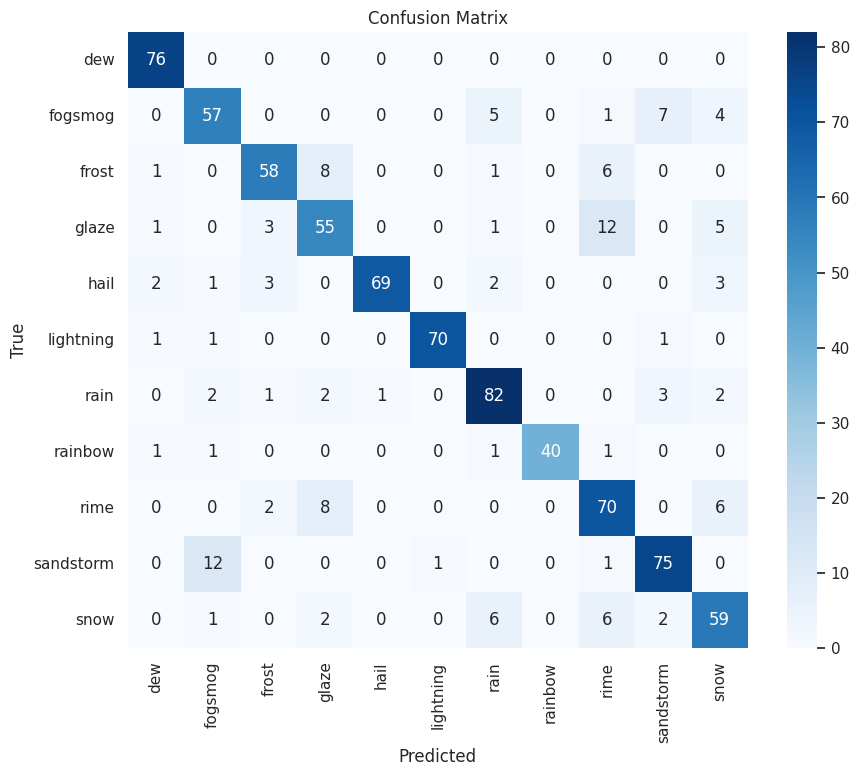

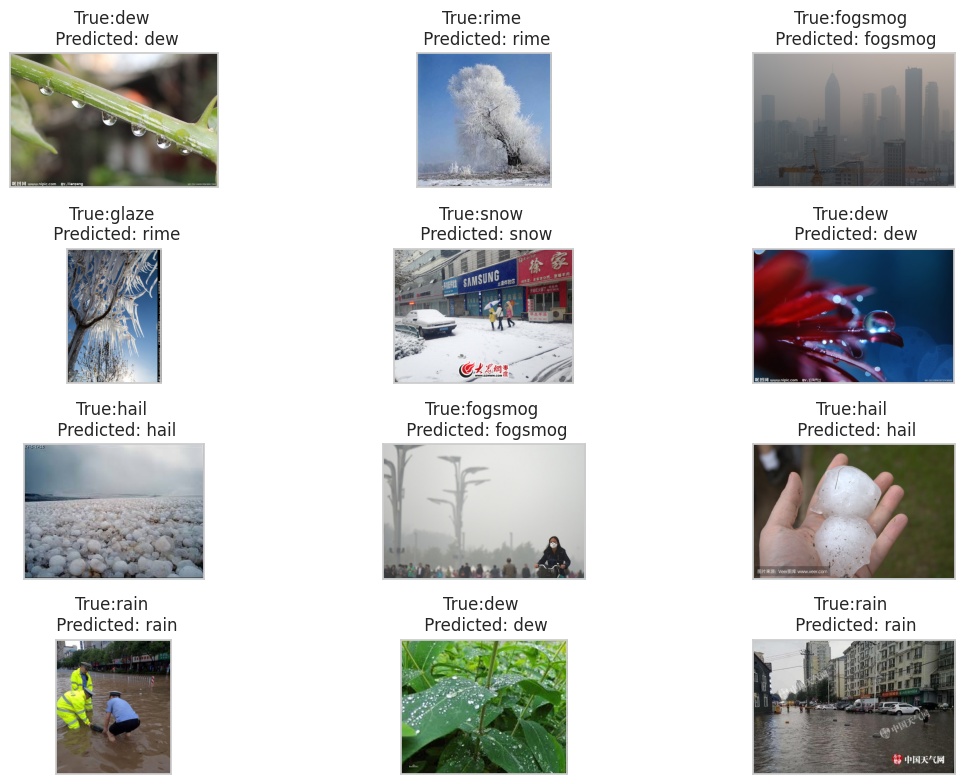

27/27 ━━━━━━━━━━━━━━━━━━━━ 13s 481ms/step - accuracy: 0.8548 - loss: 0.4341
Test Loss: 0.46
Test Accuracy: 0.84


In [ ]:
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input

train_gen, valid_gen, test_gen = data_generator(preprocess_input, train_data, test_data, 299)
inception_model, callback = model_structure(InceptionResNetV2, 299)
history = inception_model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=100,
    callbacks=callback
)
visualize_results(history, train_gen, test_gen, inception_model)
results_inception = test_results(test_gen, inception_model,'InceptionResNetV2')
save_model(inception_model,'InceptionResNetV2')

# ✔️ VGG16

Found 2694 validated image filenames belonging to 11 classes.
Found 673 validated image filenames belonging to 11 classes.
Found 842 validated image filenames belonging to 11 classes.
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


85/85 ━━━━━━━━━━━━━━━━━━━━ 77s 815ms/step - accuracy: 0.2596 - loss: 3.4827 - val_accuracy: 0.7459 - val_loss: 0.9099
Epoch 2/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 68s 690ms/step - accuracy: 0.5824 - loss: 1.2638 - val_accuracy: 0.7905 - val_loss: 0.6747
Epoch 3/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 62s 677ms/step - accuracy: 0.6644 - loss: 1.0095 - val_accuracy: 0.7920 - val_loss: 0.6348
Epoch 4/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 82s 669ms/step - accuracy: 0.7165 - loss: 0.8406 - val_accuracy: 0.8053 - val_loss: 0.5956
Epoch 5/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 91s 771ms/step - accuracy: 0.7422 - loss: 0.8005 - val_accuracy: 0.8113 - val_loss: 0.5734
Epoch 6/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 62s 674ms/step - accuracy: 0.7433 - loss: 0.7620 - val_accuracy: 0.8172 - val_loss: 0.5342
Epoch 7/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 61s 672ms/step - accuracy: 0.7862 - loss: 0.6621 - val_accuracy: 0.8395 - val_loss: 0.5023
Epoch 8/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 60s 666ms/step - accuracy: 0.7680 - loss: 0.6809 - val_accuracy

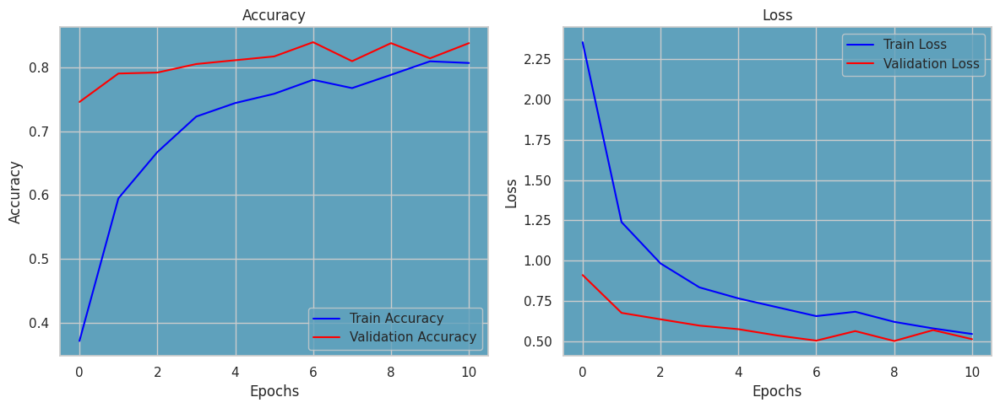

27/27 ━━━━━━━━━━━━━━━━━━━━ 7s 222ms/step
Classification Report: 
               precision    recall  f1-score   support

         dew       0.97      0.91      0.94        76
     fogsmog       0.80      0.89      0.85        74
       frost       0.67      0.78      0.72        74
       glaze       0.81      0.49      0.61        77
        hail       0.93      0.86      0.90        80
   lightning       0.92      0.99      0.95        73
        rain       0.80      0.95      0.87        93
     rainbow       1.00      0.95      0.98        44
        rime       0.69      0.91      0.78        86
   sandstorm       0.99      0.79      0.88        89
        snow       0.84      0.75      0.79        76

    accuracy                           0.84       842
   macro avg       0.86      0.84      0.84       842
weighted avg       0.85      0.84      0.84       842



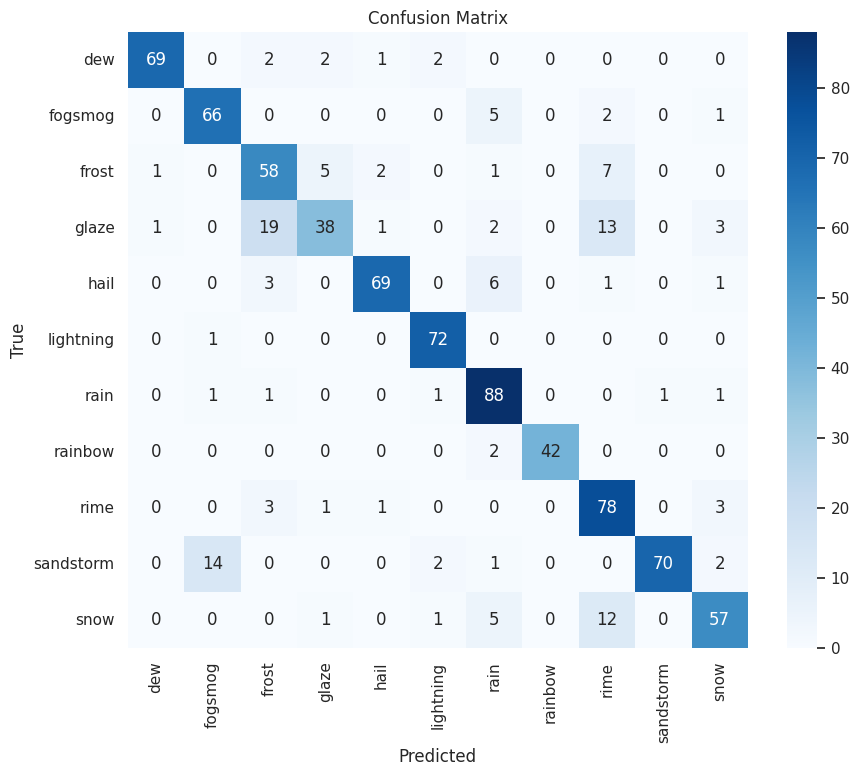

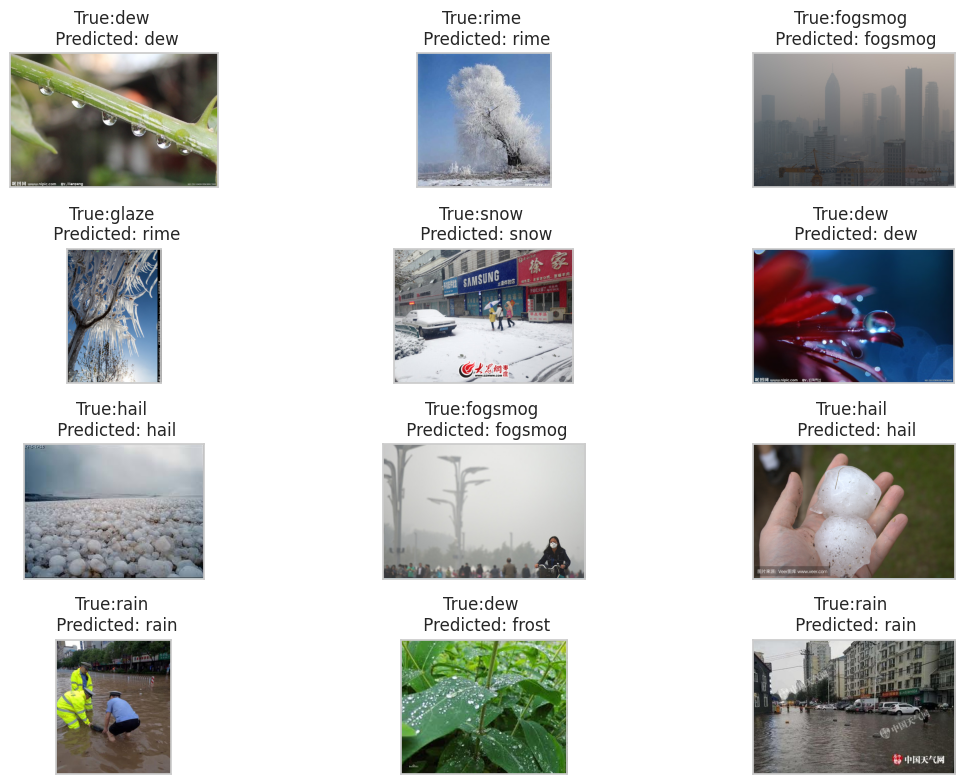

27/27 ━━━━━━━━━━━━━━━━━━━━ 7s 236ms/step - accuracy: 0.8510 - loss: 0.4545
Test Loss: 0.51
Test Accuracy: 0.84


In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input

train_gen, valid_gen, test_gen = data_generator(preprocess_input, train_data, test_data, 224)
vgg16_model, callback = model_structure(VGG16, 224)
history = vgg16_model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=100,
    callbacks=callback
)
visualize_results(history, train_gen, test_gen, vgg16_model)
results_vgg16 = test_results(test_gen, vgg16_model,'VGG16')
save_model(vgg16_model,'VGG16')

# ✔️ ResNet101

Found 2694 validated image filenames belonging to 11 classes.
Found 673 validated image filenames belonging to 11 classes.
Found 842 validated image filenames belonging to 11 classes.
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


85/85 ━━━━━━━━━━━━━━━━━━━━ 1250s 14s/step - accuracy: 0.4129 - loss: 1.8503 - val_accuracy: 0.7845 - val_loss: 0.6405
Epoch 2/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 1165s 14s/step - accuracy: 0.7560 - loss: 0.7656 - val_accuracy: 0.8143 - val_loss: 0.5724
Epoch 3/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 1164s 14s/step - accuracy: 0.7770 - loss: 0.6832 - val_accuracy: 0.8321 - val_loss: 0.4919
Epoch 4/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 1164s 14s/step - accuracy: 0.8123 - loss: 0.5674 - val_accuracy: 0.8187 - val_loss: 0.5188
Epoch 5/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 1172s 14s/step - accuracy: 0.8164 - loss: 0.5362 - val_accuracy: 0.8262 - val_loss: 0.4939


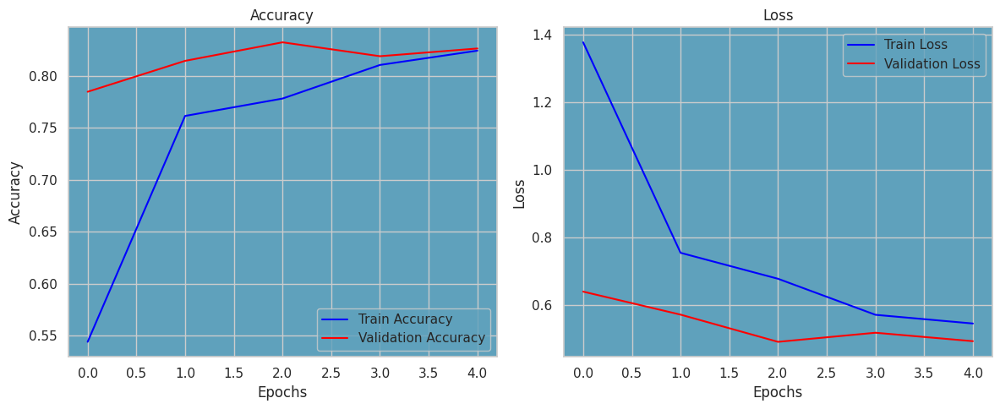

27/27 ━━━━━━━━━━━━━━━━━━━━ 296s 11s/step
Classification Report: 
               precision    recall  f1-score   support

         dew       0.88      0.91      0.90        76
     fogsmog       0.90      0.72      0.80        78
       frost       0.84      0.65      0.73       100
       glaze       0.70      0.67      0.68        84
        hail       0.89      0.97      0.93        75
   lightning       0.97      1.00      0.98        65
        rain       0.93      0.92      0.93        61
     rainbow       0.98      0.98      0.98        50
        rime       0.66      0.86      0.75        80
   sandstorm       0.93      0.89      0.91        93
        snow       0.71      0.82      0.76        80

    accuracy                           0.84       842
   macro avg       0.86      0.85      0.85       842
weighted avg       0.85      0.84      0.84       842



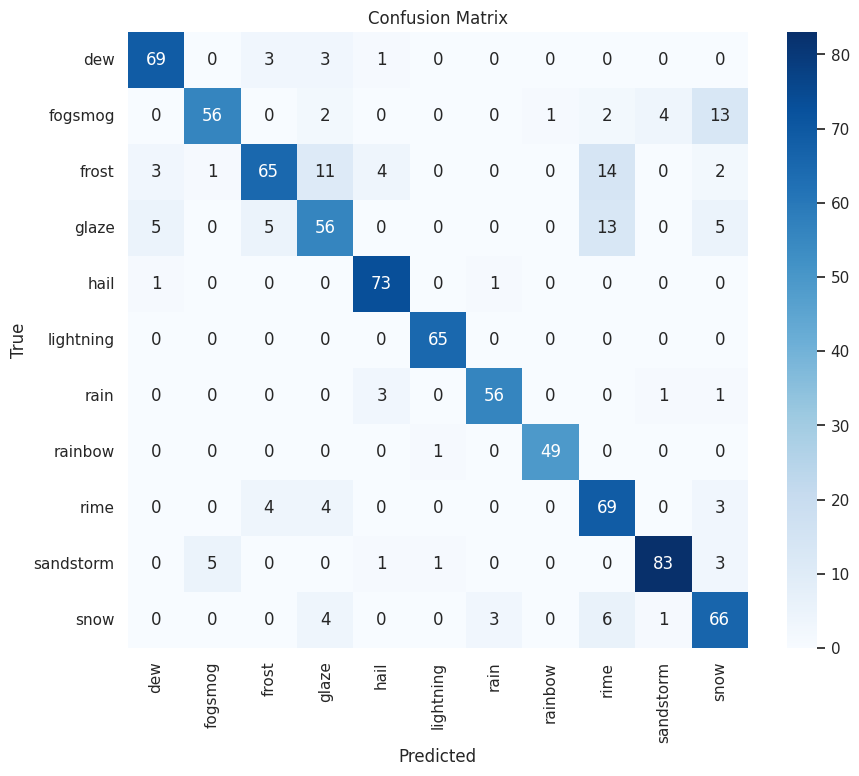

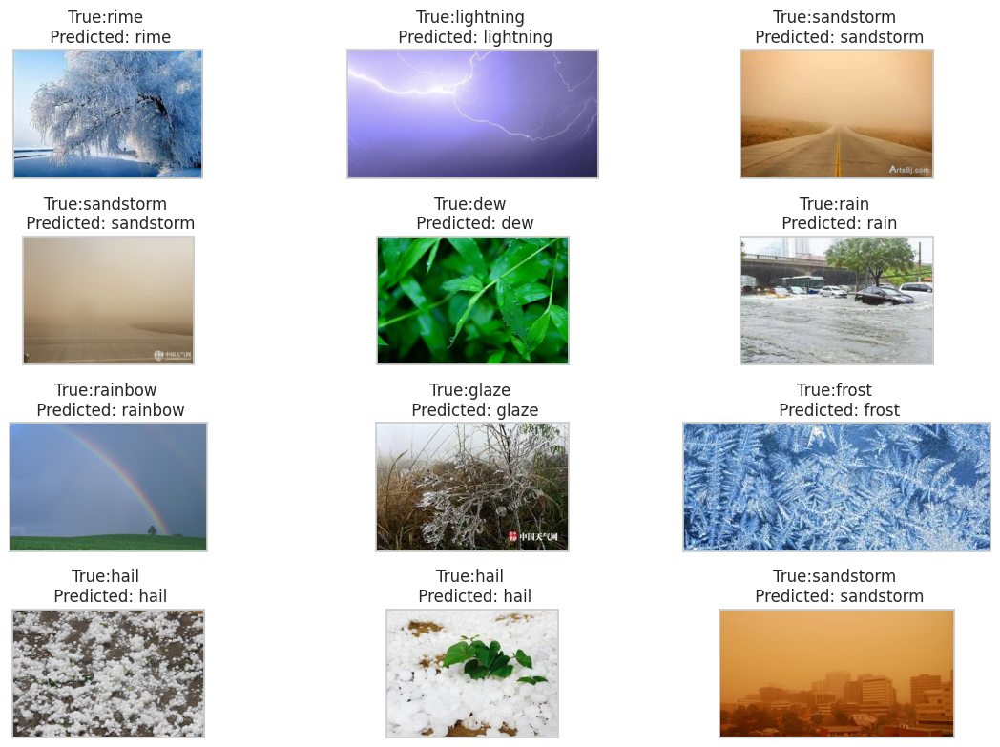

27/27 ━━━━━━━━━━━━━━━━━━━━ 284s 10s/step - accuracy: 0.8214 - loss: 0.5100
Test Loss: 0.45
Test Accuracy: 0.84


In [ ]:
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.applications.resnet import preprocess_input

train_gen, valid_gen, test_gen = data_generator(preprocess_input, train_data, test_data, 224)
resent101_model, callback = model_structure(ResNet101, 224)
history = resent101_model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=100,
    callbacks=callback
)
visualize_results(history, train_gen, test_gen, resent101_model)
results_resent101 = test_results(test_gen, resent101_model,'ResNet101')
save_model(resent101_model,'ResNet101')

# ✔️ DenseNet201

Found 2694 validated image filenames belonging to 11 classes.
Found 673 validated image filenames belonging to 11 classes.
Found 842 validated image filenames belonging to 11 classes.
74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


85/85 ━━━━━━━━━━━━━━━━━━━━ 2494s 27s/step - accuracy: 0.3255 - loss: 1.9766 - val_accuracy: 0.7905 - val_loss: 0.7066
Epoch 2/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 79s 741ms/step - accuracy: 0.7081 - loss: 0.8822 - val_accuracy: 0.8276 - val_loss: 0.5533
Epoch 3/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 84s 788ms/step - accuracy: 0.7467 - loss: 0.7425 - val_accuracy: 0.8395 - val_loss: 0.4558
Epoch 4/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 73s 816ms/step - accuracy: 0.7929 - loss: 0.6067 - val_accuracy: 0.8291 - val_loss: 0.4931
Epoch 5/100
85/85 ━━━━━━━━━━━━━━━━━━━━ 74s 829ms/step - accuracy: 0.7997 - loss: 0.5748 - val_accuracy: 0.8351 - val_loss: 0.4579


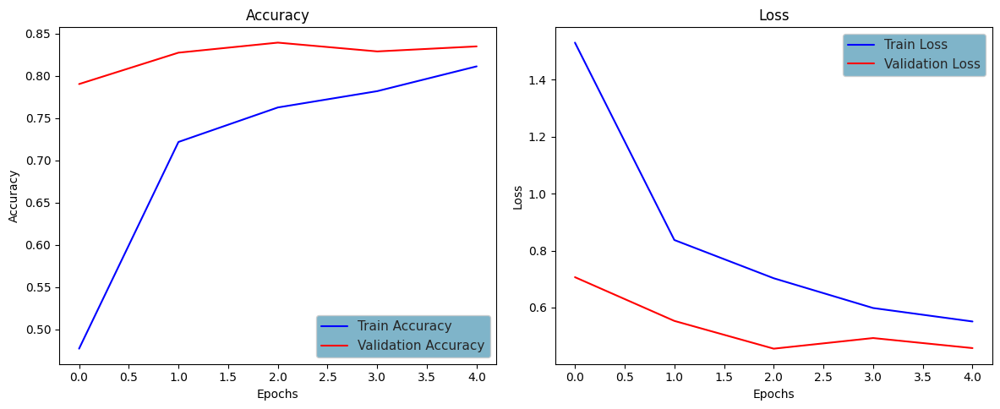

27/27 ━━━━━━━━━━━━━━━━━━━━ 586s 22s/step
Classification Report: 
               precision    recall  f1-score   support

         dew       0.96      0.85      0.90        78
     fogsmog       0.77      0.94      0.85        68
       frost       0.79      0.76      0.77        79
       glaze       0.72      0.64      0.68        75
        hail       0.96      0.89      0.93        91
   lightning       0.92      1.00      0.96        79
        rain       0.83      0.91      0.87        77
     rainbow       1.00      0.94      0.97        48
        rime       0.74      0.76      0.75        82
   sandstorm       1.00      0.82      0.90        89
        snow       0.67      0.80      0.73        76

    accuracy                           0.84       842
   macro avg       0.85      0.85      0.85       842
weighted avg       0.85      0.84      0.84       842



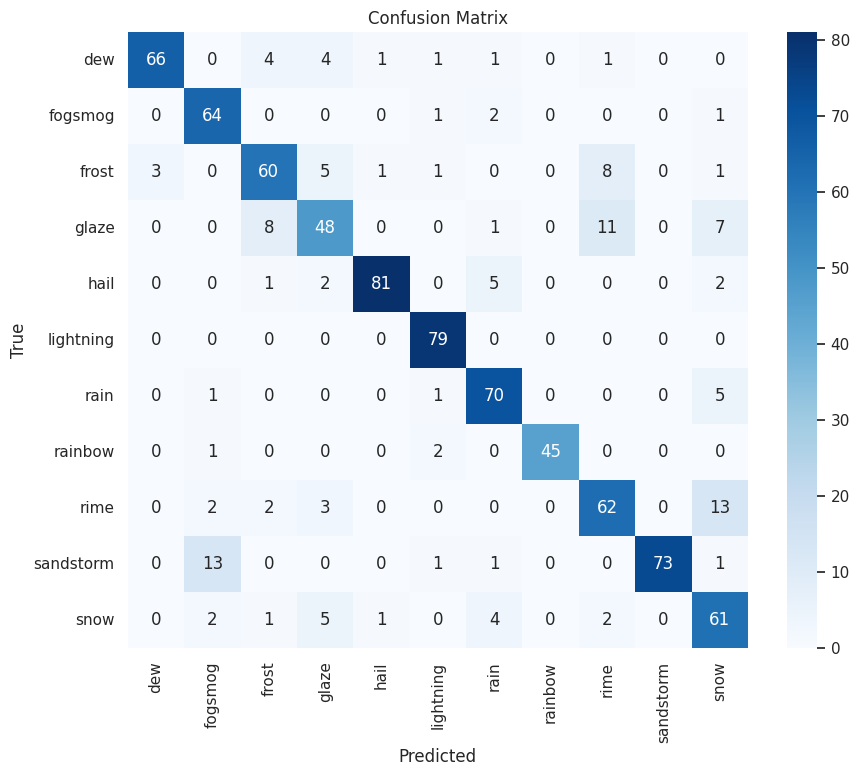

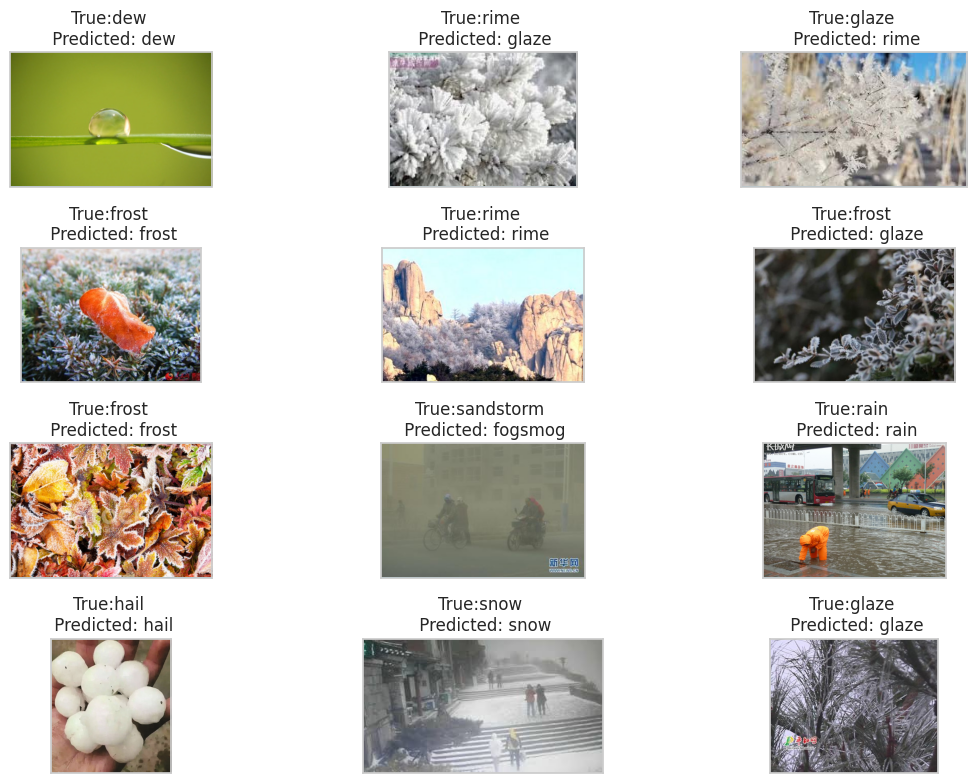

27/27 ━━━━━━━━━━━━━━━━━━━━ 15s 566ms/step - accuracy: 0.8497 - loss: 0.4329
Test Loss: 0.47
Test Accuracy: 0.84


In [ ]:
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.applications.densenet import preprocess_input

train_gen, valid_gen, test_gen = data_generator(preprocess_input, train_data, test_data, 224)
densenet201_model, callback = model_structure(DenseNet201, 224)
history = densenet201_model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=100,
    callbacks=callback
)
visualize_results(history, train_gen, test_gen, densenet201_model)
results_densenet201 = test_results(test_gen, densenet201_model,'DenseNet201')
save_model(densenet201_model,'DenseNet201')

# 📊 Final Report

In [3]:
os.chdir('../')

In [7]:
import json
import glob
import os
import pandas as pd

path = 'notebook/artifacts_notebook/results/'
json_path = glob.glob(path+'/*.json')
scores=[]

for path in json_path:
    #print(path)
    root_path,model_name = os.path.split(path)
    model_name = model_name.replace('.json', "")
    with open(path, 'r') as file:
        json_file = json.load(file)
      
    results = {
        'Model': model_name,
        'Test_Loss': json_file['Test Loss'],
        'Test_Accuracy': json_file['Test Accuracy']
    }

    scores.append(results)

scores_df = pd.DataFrame(scores)
scores_df.to_csv('notebook/artifacts_notebook/results/scores.csv', index=False, columns=['Model', 'Test_Loss','Test_Accuracy'])
print(scores_df)  

    

               Model  Test_Loss  Test_Accuracy
0        DenseNet201   0.474534       0.842043
1    Efficient_model   0.400528       0.856295
2  InceptionResNetV2   0.461665       0.844418
3          MobileNet   0.352648       0.869359
4          ResNet101   0.449279       0.839667
5        Resnet152V2   0.343798       0.881235
6           ResNet50   0.357801       0.881235
7              VGG16   0.511555       0.839667
8              VGG19   0.500884       0.845606
9           Xception   0.490991       0.846793


## Visualizing the results

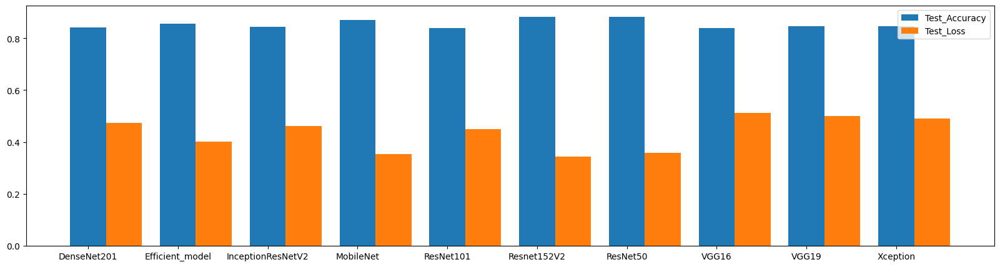

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20,5))
plt.bar([0,1,2,3,4,5,6,7,8,9], scores_df['Test_Accuracy'], width=0.4, label='Test_Accuracy')
plt.bar([0.4,1.4,2.4,3.4,4.4,5.4,6.4,7.4,8.4,9.4], scores_df['Test_Loss'], width=0.4, label='Test_Loss')
plt.xticks([0,1,2,3,4,5,6,7,8,9], scores_df['Model'])
plt.legend()
plt.show()

##### I am considering ResNet152V2 model

## Predict the image

In [50]:
from tensorflow.keras.applications.resnet import preprocess_input

train_gen, valid_gen, test_gen = data_generator(preprocess_input, train_data, test_data, 256)
labels = train_gen.class_indices
labels = {v:k for k,v in labels.items()}
with open('notebook/artifacts_notebook/labels/label.json', 'w') as file:
    json.dump(labels, file)
with open('notebook/artifacts_notebook/models/Resnet152V2.pkl', 'rb') as file:
    model = pickle.load(file)

Found 2694 validated image filenames belonging to 11 classes.
Found 673 validated image filenames belonging to 11 classes.
Found 842 validated image filenames belonging to 11 classes.


In [51]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

def predict_image_and_display(model, preprocessor, labels, img_path, img_size):
    # Load and preprocess the image
    img = load_img(img_path, target_size=(img_size, img_size))
    img_array = img_to_array(img)
    img_array_expanded = np.expand_dims(img_array, axis=0)
    img_preprocessed = preprocessor(img_array_expanded)

    # Predict
    predictions = model.predict(img_preprocessed)
    predicted_index = np.argmax(predictions, axis=1)[0]
    confidence = np.max(predictions)
    predicted_label = labels[predicted_index]

    # Display the image with prediction
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Prediction: {predicted_label}\nConfidence: {confidence:.2f}")
    plt.show()

    return predicted_label, confidence


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


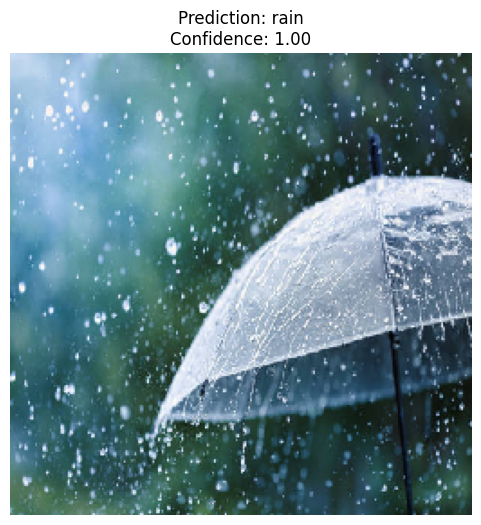

Predicted_Image:  rain
Confidence:  0.9992588


In [52]:
img_path = 'predict/img1.jpg'
predicted_image, confidence = predict_image_and_display(model, preprocess_input, labels, img_path, 256)
print('Predicted_Image: ', predicted_image)
print('Confidence: ', confidence)